# XAI-Verified Improvement Confirmation



## Cell 1 — Install dependencies

In [1]:
import subprocess, sys
def _pip_install(pkg):
    subprocess.run([sys.executable, "-m", "pip", "install", "-q", pkg], check=False)
for pkg in ["ultralytics", "grad-cam", "opencv-python-headless"]:
    _pip_install(pkg)
import torch
print("Torch:", torch.__version__, "| CUDA available:", torch.cuda.is_available())
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 37.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.2/66.2 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.5/44.5 kB 2.0 MB/s eta 0:00:00
Torch: 2.10.0+cu128 | CUDA available: True
Using device: cuda


## Cell 2 — Imports

In [2]:
import os, glob, json, random, shutil
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import torch

from ultralytics import YOLO
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

print("Imports OK")

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.
Imports OK


## Cell 3 — Configuration

In [3]:
SEED = 42
IMG_SIZE = 640
CONF_THRESHOLD = 0.25
IOU_MATCH_THRESHOLD = 0.50

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

OUTPUT_ROOT = "/kaggle/working/phase6_xai_verification"
FIGURES_DIR = os.path.join(OUTPUT_ROOT, "figures")
RESULTS_DIR = os.path.join(OUTPUT_ROOT, "results")
PLOTS_DIR = os.path.join(OUTPUT_ROOT, "plots")
CONFIG_DIR = os.path.join(OUTPUT_ROOT, "config")

for d in [OUTPUT_ROOT, FIGURES_DIR, RESULTS_DIR, PLOTS_DIR, CONFIG_DIR]:
    os.makedirs(d, exist_ok=True)

DPI = 300
print("Phase 6 configuration loaded.")

Phase 6 configuration loaded.


## Cell 4 — Locate Phase 3 (test images), Phase 4 (diagnosis cases), and Phase 5 (after-model) outputs



## Cell 5 — Load Before and After models

In [5]:
before_yolo = YOLO(BEFORE_MODEL_PATH)
before_yolo.to(DEVICE)
before_torch = before_yolo.model
before_torch.eval()

after_yolo = YOLO(AFTER_MODEL_PATH)
after_yolo.to(DEVICE)
after_torch = after_yolo.model
after_torch.eval()

for m in (before_torch, after_torch):
    for p in m.parameters():
        p.requires_grad_(True)

print("Before model loaded from:", BEFORE_MODEL_PATH)
print("After model loaded from :", AFTER_MODEL_PATH)

Before model loaded from: /kaggle/input/datasets/mdshaparan/phase03-dataset/model/best.pt
After model loaded from : /kaggle/input/datasets/mdshaparan/phase4-phase-5-output/phase5_mitigation_results_v1/models/after_mitigation_best.pt


## Cell 6 — Identify the CAM target layer (same logic as Phase 4, applied to BOTH models)

Since both models share the exact YOLO11s architecture, the same layer index applies to both.

In [4]:
def find_by_marker(marker_filename, extra_check=None):
    candidates = []
    for root in ("/kaggle/input", "/kaggle/working"):
        for path in glob.glob(os.path.join(root, "**", marker_filename), recursive=True):
            d = os.path.dirname(path)
            if extra_check is None or extra_check(d):
                candidates.append(d)
    return sorted(set(candidates))


phase3_candidates = find_by_marker("phase3_config.json", lambda d: os.path.isdir(os.path.join(d, "degraded_datasets")))
if not phase3_candidates:
    raise FileNotFoundError("No Phase 3 output found. Add the Phase 3 output zip as a Kaggle Input dataset.")
PHASE3_ROOT = phase3_candidates[0]
print("PHASE3_ROOT:", PHASE3_ROOT)

CLEAN_TEST_IMAGES_DIR = os.path.join(PHASE3_ROOT, "clean_test_set", "images")
DEGRADED_DIR = os.path.join(PHASE3_ROOT, "degraded_datasets")


phase4_candidates = find_by_marker("phase4_xai_cases.csv")
if not phase4_candidates:
    raise FileNotFoundError("No phase4_xai_cases.csv found. Add the Phase 4 output zip as a Kaggle Input dataset.")
PHASE4_RESULTS_DIR = phase4_candidates[0]
phase4_cases_df = pd.read_csv(os.path.join(PHASE4_RESULTS_DIR, "phase4_xai_cases.csv"))
print("\nPhase 4 diagnosis cases loaded:", len(phase4_cases_df), "rows")


BEFORE_MODEL_PATH = os.path.join(PHASE3_ROOT, "model", "best.pt")
if not os.path.exists(BEFORE_MODEL_PATH):
    cands = glob.glob("/kaggle/input/**/best.pt", recursive=True)
    if not cands:
        raise FileNotFoundError("No baseline best.pt found.")
    BEFORE_MODEL_PATH = cands[0]
print("BEFORE_MODEL_PATH:", BEFORE_MODEL_PATH)


after_candidates = find_by_marker("after_mitigation_best.pt") if False else []
after_candidates = glob.glob("/kaggle/input/**/after_mitigation_best.pt", recursive=True) + \
                   glob.glob("/kaggle/working/**/after_mitigation_best.pt", recursive=True)
if not after_candidates:
    raise FileNotFoundError("No after_mitigation_best.pt found. Add the Phase 5 output zip as a Kaggle Input dataset.")
AFTER_MODEL_PATH = after_candidates[0]
print("AFTER_MODEL_PATH:", AFTER_MODEL_PATH)

with open(os.path.join(PHASE3_ROOT, "phase3_config.json")) as f:
    phase3_config = json.load(f)
CLASS_NAMES = phase3_config.get("class_names", ["Fire", "Smoke"])
NUM_CLASSES = len(CLASS_NAMES)
print("CLASS_NAMES:", CLASS_NAMES)

PHASE3_ROOT: /kaggle/input/datasets/mdshaparan/phase03-dataset

Phase 4 diagnosis cases loaded: 32 rows
BEFORE_MODEL_PATH: /kaggle/input/datasets/mdshaparan/phase03-dataset/model/best.pt
AFTER_MODEL_PATH: /kaggle/input/datasets/mdshaparan/phase4-phase-5-output/phase5_mitigation_results_v1/models/after_mitigation_best.pt
CLASS_NAMES: ['Fire', 'Smoke']


In [6]:
def find_cam_layer(torch_model):
    blocks = list(torch_model.model.children())
    detect_idx = None
    for i, b in enumerate(blocks):
        if "Detect" in b.__class__.__name__:
            detect_idx = i
    if detect_idx is None:
        raise RuntimeError("Could not locate Detect head.")
    return blocks[detect_idx - 1], detect_idx - 1

before_target_layer, layer_idx = find_cam_layer(before_torch)
after_target_layer, _ = find_cam_layer(after_torch)
print(f"CAM target layer index: {layer_idx} ({before_target_layer.__class__.__name__})")

CAM target layer index: 22 (C3k2)


## Cell 7 — Box-anchored Grad-CAM utilities (same design as Phase 4)



In [7]:
def preprocess_image(img_path, imgsz=IMG_SIZE):
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (imgsz, imgsz))
    img_float = img_resized.astype(np.float32) / 255.0
    tensor = torch.from_numpy(img_float).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
    tensor.requires_grad_(True)
    return img_float, tensor

def scale_box_to_input(box, orig_hw, imgsz=IMG_SIZE):
    if box is None:
        return None
    orig_h, orig_w = orig_hw
    sx, sy = imgsz / orig_w, imgsz / orig_h
    x1, y1, x2, y2 = box
    return [x1 * sx, y1 * sy, x2 * sx, y2 * sy]

def iou_xyxy_np(a, b):
    ax1, ay1, ax2, ay2 = a
    bx1, by1, bx2, by2 = b
    ix1, iy1 = np.maximum(ax1, bx1), np.maximum(ay1, by1)
    ix2, iy2 = np.minimum(ax2, bx2), np.minimum(ay2, by2)
    iw, ih = np.clip(ix2 - ix1, 0, None), np.clip(iy2 - iy1, 0, None)
    inter = iw * ih
    area_a = np.clip(ax2 - ax1, 0, None) * np.clip(ay2 - ay1, 0, None)
    area_b = np.clip(bx2 - bx1, 0, None) * np.clip(by2 - by1, 0, None)
    union = area_a + area_b - inter
    return np.where(union > 0, inter / union, 0.0)

class YOLOBoxAnchoredTarget:
    def __init__(self, class_idx, box_640, iou_thresh=0.10):
        self.class_idx = class_idx
        self.box_640 = np.array(box_640, dtype=np.float32)
        self.iou_thresh = iou_thresh

    def __call__(self, model_output):
        out = model_output[0] if isinstance(model_output, (tuple, list)) else model_output
        if not (out.dim() == 3 and out.shape[1] >= 4 + NUM_CLASSES):
            raise RuntimeError(f"Unexpected raw output shape {tuple(out.shape)}")
        boxes = out[0, 0:4, :].detach().cpu().numpy().T
        ious = iou_xyxy_np(boxes.T, self.box_640[:, None])
        match_idx = np.where(ious >= self.iou_thresh)[0]
        if len(match_idx) == 0:
            match_idx = np.array([int(np.argmax(ious))])
        class_scores = out[0, 4 + self.class_idx, :]
        return class_scores[match_idx].max()

class YOLOClassScoreTarget:
    """Unanchored fallback: only used if no box is available for this case."""
    def __init__(self, class_idx):
        self.class_idx = class_idx

    def __call__(self, model_output):
        out = model_output[0] if isinstance(model_output, (tuple, list)) else model_output
        class_scores = out[:, 4 + self.class_idx, :]
        return class_scores.max()

def compute_cam(torch_model, target_layer, tensor, class_idx, box_640=None):

    with torch.no_grad():
        _ = torch_model(torch.zeros(1, 3, IMG_SIZE - 32, IMG_SIZE - 32, device=DEVICE))

    cam = GradCAM(torch_model, [target_layer])
    if box_640 is not None:
        targets = [YOLOBoxAnchoredTarget(class_idx, box_640)]
    else:
        targets = [YOLOClassScoreTarget(class_idx)]
    return cam(input_tensor=tensor, targets=targets)[0, :, :]

def run_inference(yolo_model, img_path, conf=CONF_THRESHOLD, imgsz=IMG_SIZE):
    result = yolo_model.predict(img_path, imgsz=imgsz, conf=conf, verbose=False)[0]
    boxes = [
        {"cls": int(c), "conf": float(cf), "box": b.tolist()}
        for b, c, cf in zip(result.boxes.xyxy.cpu(), result.boxes.cls.cpu(), result.boxes.conf.cpu())
    ]
    return boxes, result.orig_shape

def inside_box_ratio(gray_cam, box, img_shape_hw, cam_shape_hw):
    if box is None:
        return None
    orig_h, orig_w = img_shape_hw
    cam_h, cam_w = cam_shape_hw
    sx, sy = cam_w / orig_w, cam_h / orig_h
    x1, y1, x2, y2 = box
    x1, y1, x2, y2 = int(x1 * sx), int(y1 * sy), int(x2 * sx), int(y2 * sy)
    x1, x2 = max(0, min(x1, cam_w)), max(0, min(x2, cam_w))
    y1, y2 = max(0, min(y1, cam_h)), max(0, min(y2, cam_h))
    total = gray_cam.sum()
    if total <= 0 or x2 <= x1 or y2 <= y1:
        return None
    inside = gray_cam[y1:y2, x1:x2].sum()
    return float(inside / total)

print("Box-anchored Grad-CAM utilities ready (with inference-mode fix).")

Box-anchored Grad-CAM utilities ready (with inference-mode fix).


## Cell 8 — Select representative cases to re-verify



In [8]:
VERIFICATION_CASE_IDS = [
    "Noise_Failure_018",     
    "LowLight_FN_011",        
    "MotionBlur_Failure_015", 
]

selected_cases = phase4_cases_df[phase4_cases_df["Case_ID"].isin(VERIFICATION_CASE_IDS)].copy()
print(f"Found {len(selected_cases)} / {len(VERIFICATION_CASE_IDS)} requested cases in the Phase 4 CSV.")
missing = set(VERIFICATION_CASE_IDS) - set(selected_cases["Case_ID"])
if missing:
    print("WARNING: these case IDs were not found in phase4_xai_cases.csv:", missing)
selected_cases[["Case_ID", "Condition", "Severity", "Ground_Truth_Class", "Predicted_Class", "Failure_Type"]]

Found 3 / 3 requested cases in the Phase 4 CSV.


,Case_ID,Condition,Severity,Ground_Truth_Class,Predicted_Class,Failure_Type
10,LowLight_FN_011,Low Light,4,Smoke,Missed,FN
14,MotionBlur_Failure_015,Motion Blur,4,Fire,Missed,FN
17,Noise_Failure_018,Gaussian Noise,4,Background/None,Fire,FP


## Cell 9 — Resolve each case's image path in THIS session



In [9]:
def resolve_image_path(stored_path, condition, severity):
    fname = os.path.basename(stored_path)
    if condition == "Clean":
        candidate = os.path.join(CLEAN_TEST_IMAGES_DIR, fname)
    else:
        deg_key = condition.lower().replace(" ", "_")
        candidate = os.path.join(DEGRADED_DIR, deg_key, f"severity_{int(severity)}", "images", fname)
    return candidate if os.path.exists(candidate) else None

resolved_rows = []
for _, row in selected_cases.iterrows():
    resolved = resolve_image_path(row["Image_Path"], row["Condition"], row["Severity"])
    print(f"{row['Case_ID']}: {'FOUND' if resolved else 'MISSING'} -> {resolved}")
    resolved_rows.append(resolved)
selected_cases["Resolved_Image_Path"] = resolved_rows

if selected_cases["Resolved_Image_Path"].isna().any() or (selected_cases["Resolved_Image_Path"] == None).any():
    print("\nWARNING: some images could not be resolved -- those cases will be skipped.")

LowLight_FN_011: FOUND -> /kaggle/input/datasets/mdshaparan/phase03-dataset/degraded_datasets/low_light/severity_4/images/0060_jpg.rf.b4d9887b38989360fc41aecd5c03b8f7.jpg
MotionBlur_Failure_015: FOUND -> /kaggle/input/datasets/mdshaparan/phase03-dataset/degraded_datasets/motion_blur/severity_4/images/0052_jpg.rf.c50ae96112419079f22bc8aa65a3936a.jpg
Noise_Failure_018: FOUND -> /kaggle/input/datasets/mdshaparan/phase03-dataset/degraded_datasets/gaussian_noise/severity_4/images/0108_jpg.rf.e859bb6605a3473c1fccf63b92c02729.jpg


## Cell 10 — For each case: Before vs After detection + Grad-CAM, triptych figure

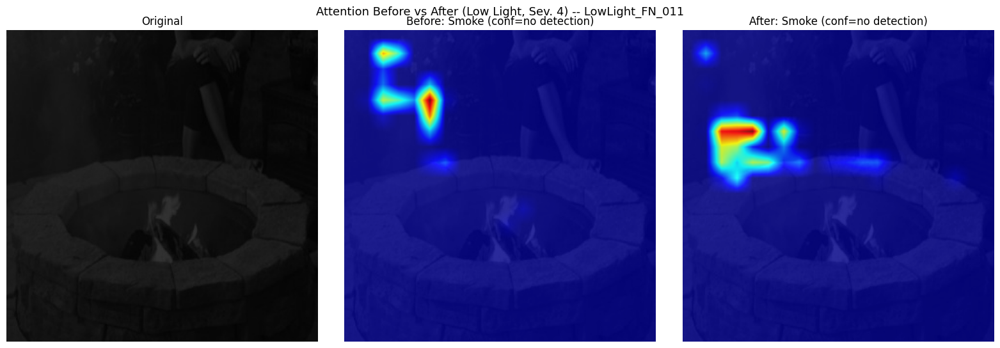

Saved: /kaggle/working/phase6_xai_verification/figures/LowLight_FN_011.png / .pdf


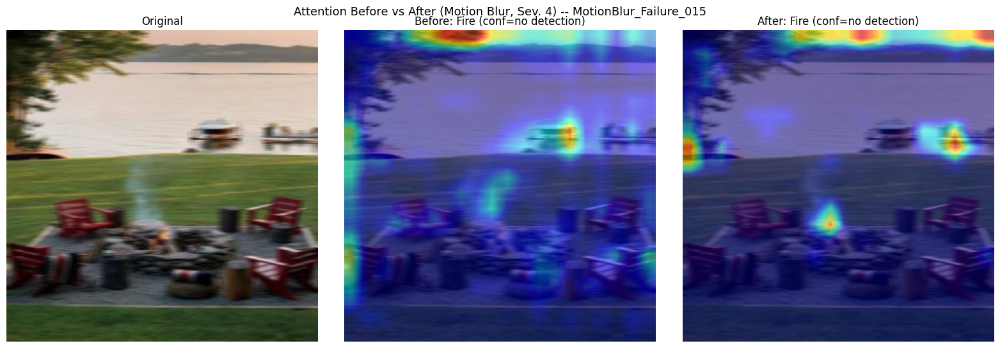

Saved: /kaggle/working/phase6_xai_verification/figures/MotionBlur_Failure_015.png / .pdf
  [Noise_Failure_018] GT class Background/None not in CLASS_NAMES -- falling back to Predicted_Class Fire


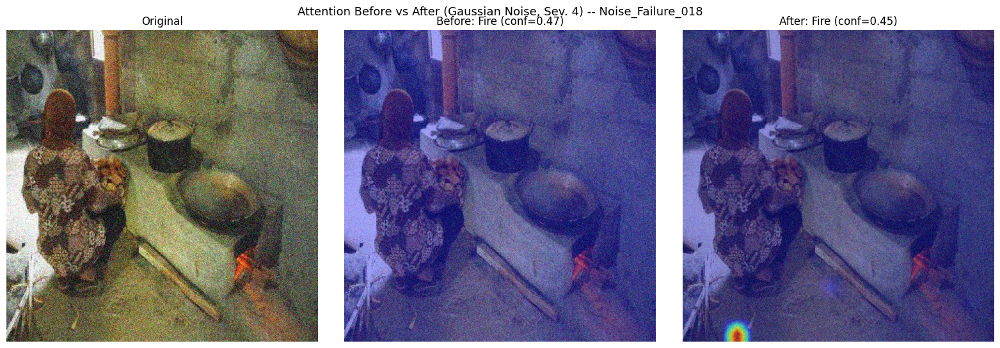

Saved: /kaggle/working/phase6_xai_verification/figures/Noise_Failure_018.png / .pdf


,Case_ID,Condition,Severity,GT_Label_Raw,CAM_Target_Class,Before_Detected,Before_Confidence,Before_GT_Box_Activation_Ratio,After_Detected,After_Confidence,After_GT_Box_Activation_Ratio,Figure_Path
0,LowLight_FN_011,Low Light,4,Smoke,Smoke,False,NaN,0.755360,False,NaN,0.785973,/kaggle/working/phase6_xai_verification/figure...
1,MotionBlur_Failure_015,Motion Blur,4,Fire,Fire,False,NaN,0.006752,False,NaN,0.014707,/kaggle/working/phase6_xai_verification/figure...
2,Noise_Failure_018,Gaussian Noise,4,Background/None,Fire,True,0.472282,NaN,True,0.452174,NaN,/kaggle/working/phase6_xai_verification/figure...


In [10]:
verification_records = []

for _, row in selected_cases.iterrows():
    case_id = row["Case_ID"]
    img_path = row["Resolved_Image_Path"]
    if img_path is None:
        print(f"Skipping {case_id}: image not found in this session.")
        continue

    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    h, w = img_rgb.shape[:2]

    gt_name = row["Ground_Truth_Class"]
    pred_name = row["Predicted_Class"]
    condition = row["Condition"]
    severity = row["Severity"]
    target_cls = CLASS_NAMES.index(gt_name) if gt_name in CLASS_NAMES else None

    labels_dir = os.path.dirname(img_path).replace("images", "labels")
    label_path = os.path.join(labels_dir, os.path.splitext(os.path.basename(img_path))[0] + ".txt")
    gt_box = None
    if target_cls is not None and os.path.exists(label_path):
        with open(label_path) as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) != 5:
                    continue
                cls_id, xc, yc, bw, bh = int(parts[0]), *map(float, parts[1:])
                if cls_id == target_cls:
                    gt_box = [(xc - bw/2) * w, (yc - bh/2) * h, (xc + bw/2) * w, (yc + bh/2) * h]
                    break

    if target_cls is not None:
        class_idx = target_cls
    elif pred_name in CLASS_NAMES:
        class_idx = CLASS_NAMES.index(pred_name)
        print(f"  [{case_id}] GT class {gt_name} not in CLASS_NAMES -- falling back to Predicted_Class {pred_name}")
    else:
        class_idx = 0
        print(f"  [{case_id}] WARNING: neither GT nor Predicted class resolvable -- defaulting to class 0")

    display_class_name = CLASS_NAMES[class_idx]
    box_640 = scale_box_to_input(gt_box, (h, w), IMG_SIZE) if gt_box else None

    before_boxes, _ = run_inference(before_yolo, img_path)
    before_match = next((b for b in before_boxes if b["cls"] == class_idx), None)
    before_conf = before_match["conf"] if before_match else None
    _, tensor_b = preprocess_image(img_path)
    gray_before = compute_cam(before_torch, before_target_layer, tensor_b, class_idx, box_640)
    ratio_before = inside_box_ratio(gray_before, gt_box, (h, w), gray_before.shape) if gt_box else None

    after_boxes, _ = run_inference(after_yolo, img_path)
    after_match = next((b for b in after_boxes if b["cls"] == class_idx), None)
    after_conf = after_match["conf"] if after_match else None
    _, tensor_a = preprocess_image(img_path)
    gray_after = compute_cam(after_torch, after_target_layer, tensor_a, class_idx, box_640)
    ratio_after = inside_box_ratio(gray_after, gt_box, (h, w), gray_after.shape) if gt_box else None

    img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE))
    img_float = img_resized.astype(np.float32) / 255.0
    before_overlay = show_cam_on_image(img_float, gray_before, use_rgb=True)
    after_overlay = show_cam_on_image(img_float, gray_after, use_rgb=True)

    fig, axes = plt.subplots(1, 3, figsize=(16, 5.5))
    axes[0].imshow(img_rgb); axes[0].set_title("Original"); axes[0].axis("off")

    before_conf_str = f"{before_conf:.2f}" if before_conf is not None else "no detection"
    axes[1].imshow(before_overlay)
    axes[1].set_title(f"Before: {display_class_name} (conf={before_conf_str})"); axes[1].axis("off")

    after_conf_str = f"{after_conf:.2f}" if after_conf is not None else "no detection"
    axes[2].imshow(after_overlay)
    axes[2].set_title(f"After: {display_class_name} (conf={after_conf_str})"); axes[2].axis("off")

    plt.suptitle(f"Attention Before vs After ({condition}, Sev. {severity}) -- {case_id}", fontsize=13)
    plt.tight_layout()
    out_path = os.path.join(FIGURES_DIR, case_id)
    for ext in ("png", "pdf"):
        plt.savefig(f"{out_path}.{ext}", dpi=DPI, bbox_inches="tight")
    plt.show()
    plt.close()
    print(f"Saved: {out_path}.png / .pdf")

    verification_records.append({
        "Case_ID": case_id,
        "Condition": condition,
        "Severity": severity,
        "GT_Label_Raw": gt_name,
        "CAM_Target_Class": display_class_name,
        "Before_Detected": before_match is not None,
        "Before_Confidence": before_conf,
        "Before_GT_Box_Activation_Ratio": ratio_before,
        "After_Detected": after_match is not None,
        "After_Confidence": after_conf,
        "After_GT_Box_Activation_Ratio": ratio_after,
        "Figure_Path": f"{out_path}.png",
    })

verification_df = pd.DataFrame(verification_records)
verification_df


## Cell 11 — Quantitative comparison plots

## Cell 11b — Search for illustrative cases (Noise + Low-Light) -- QUALITATIVE ONLY




Searching Gaussian Noise severity 4 for illustrative cases...
Found 3 verified illustrative case(s).


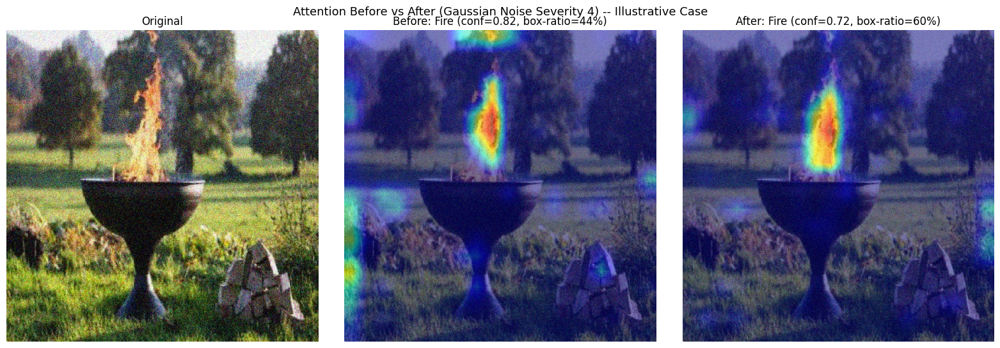

Saved: /kaggle/working/phase6_xai_verification/figures/illustrative_noise_1.png / .pdf


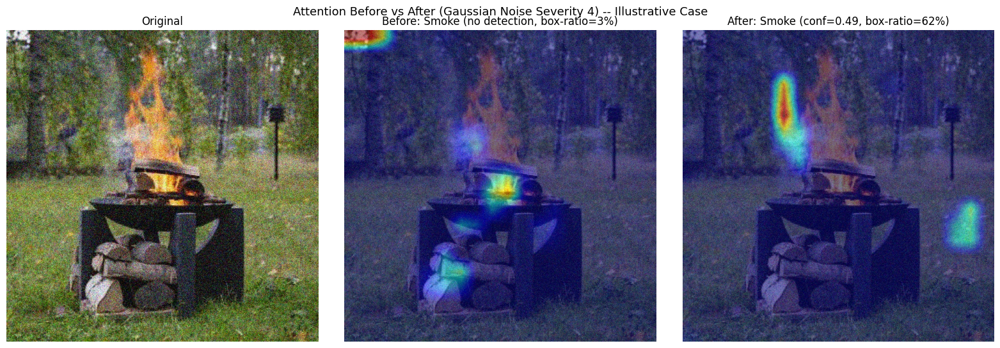

Saved: /kaggle/working/phase6_xai_verification/figures/illustrative_noise_2.png / .pdf


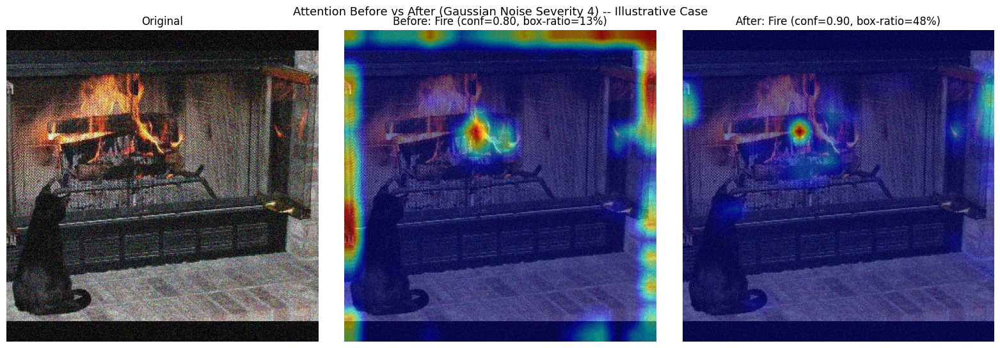

Saved: /kaggle/working/phase6_xai_verification/figures/illustrative_noise_3.png / .pdf

Searching Low Light severity 4 for illustrative cases...
Found 3 verified illustrative case(s).


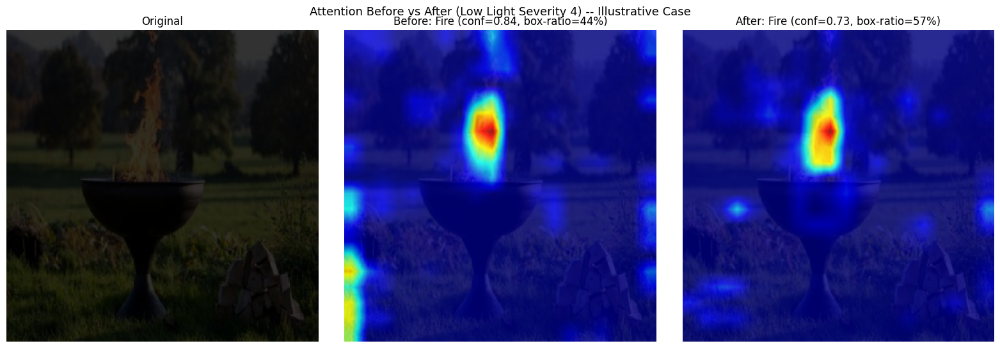

Saved: /kaggle/working/phase6_xai_verification/figures/illustrative_lowlight_1.png / .pdf


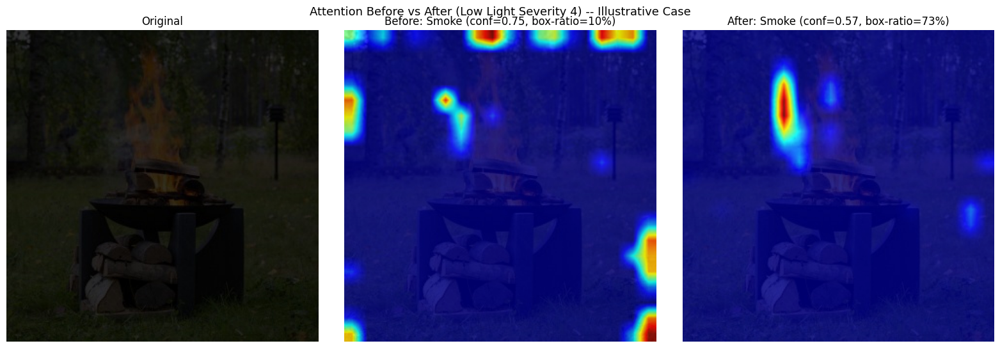

Saved: /kaggle/working/phase6_xai_verification/figures/illustrative_lowlight_2.png / .pdf


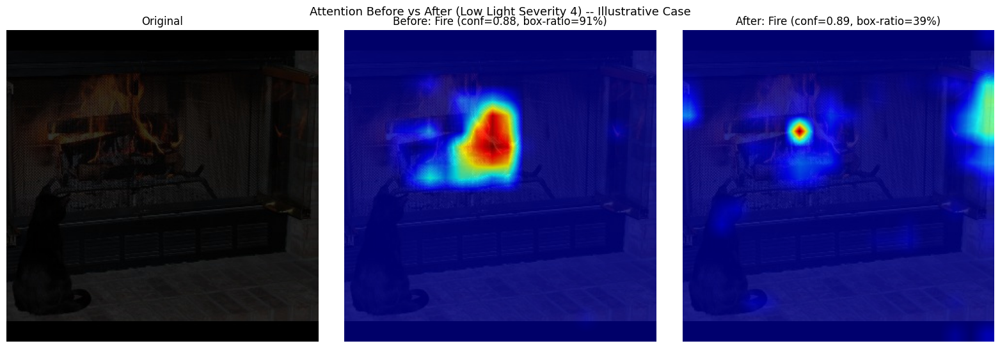

Saved: /kaggle/working/phase6_xai_verification/figures/illustrative_lowlight_3.png / .pdf

Saved: /kaggle/working/phase6_xai_verification/results/illustrative_verified_cases.csv


,Condition,Case_Num,Class,Before_Confidence,Before_Box_Ratio,After_Confidence,After_Box_Ratio
0,Gaussian Noise,1,Fire,0.816111,0.440269,0.718879,0.601277
1,Gaussian Noise,2,Smoke,NaN,0.033989,0.485224,0.618595
2,Gaussian Noise,3,Fire,0.797679,0.132024,0.899560,0.477623
3,Low Light,1,Fire,0.840381,0.442808,0.726960,0.574869
4,Low Light,2,Smoke,0.752308,0.104565,0.568584,0.733514
5,Low Light,3,Fire,0.881847,0.914929,0.888587,0.394484


In [11]:
def scan_for_illustrative_cases(condition_name, degraded_dir, n_needed=3,
                                  min_after_conf=0.35, min_after_ratio=0.30, max_scan=300):
    images_dir = os.path.join(degraded_dir, "images")
    labels_dir = images_dir.replace("images", "labels")
    image_paths = sorted(glob.glob(os.path.join(images_dir, "*")))[:max_scan]

    found = []
    for img_path in image_paths:
        label_path = os.path.join(labels_dir, os.path.splitext(os.path.basename(img_path))[0] + ".txt")
        if not os.path.exists(label_path):
            continue

        img_bgr = cv2.imread(img_path)
        h, w = img_bgr.shape[:2]
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        with open(label_path) as f:
            line = f.readline().strip().split()
        if len(line) != 5:
            continue
        gt_cls = int(line[0])
        xc, yc, bw, bh = map(float, line[1:])
        gt_box = [(xc - bw/2) * w, (yc - bh/2) * h, (xc + bw/2) * w, (yc + bh/2) * h]

        after_boxes, _ = run_inference(after_yolo, img_path)
        after_match = next((b for b in after_boxes if b["cls"] == gt_cls and b["conf"] >= min_after_conf), None)
        if after_match is None:
            continue

        box_640 = scale_box_to_input(gt_box, (h, w), IMG_SIZE)
        _, tensor = preprocess_image(img_path)
        gray_after = compute_cam(after_torch, after_target_layer, tensor, gt_cls, box_640)
        ratio_after = inside_box_ratio(gray_after, gt_box, (h, w), gray_after.shape)
        if ratio_after is None or ratio_after < min_after_ratio:
            continue

        before_boxes, _ = run_inference(before_yolo, img_path)
        before_match = next((b for b in before_boxes if b["cls"] == gt_cls), None)
        _, tensor_b = preprocess_image(img_path)
        gray_before = compute_cam(before_torch, before_target_layer, tensor_b, gt_cls, box_640)
        ratio_before = inside_box_ratio(gray_before, gt_box, (h, w), gray_before.shape)

        found.append({
            "image_path": img_path, "gt_box": gt_box, "gt_cls": gt_cls,
            "before_match": before_match, "before_ratio": ratio_before, "gray_before": gray_before,
            "after_match": after_match, "after_ratio": ratio_after, "gray_after": gray_after,
        })
        if len(found) >= n_needed:
            break
    return found

def plot_illustrative_case(case, condition_label, class_name, save_name):
    img_bgr = cv2.imread(case["image_path"])
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE))
    img_float = img_resized.astype(np.float32) / 255.0

    before_overlay = show_cam_on_image(img_float, case["gray_before"], use_rgb=True)
    after_overlay = show_cam_on_image(img_float, case["gray_after"], use_rgb=True)

    fig, axes = plt.subplots(1, 3, figsize=(16, 5.5))
    axes[0].imshow(img_rgb); axes[0].set_title("Original"); axes[0].axis("off")

    bconf = case["before_match"]["conf"] if case["before_match"] else None
    bratio = case["before_ratio"]
    bstr = f"conf={bconf:.2f}" if bconf else "no detection"
    bratio_str = f", box-ratio={bratio*100:.0f}%" if bratio is not None else ""
    axes[1].imshow(before_overlay)
    axes[1].set_title(f"Before: {class_name} ({bstr}{bratio_str})"); axes[1].axis("off")

    aconf = case["after_match"]["conf"]
    aratio = case["after_ratio"]
    axes[2].imshow(after_overlay)
    axes[2].set_title(f"After: {class_name} (conf={aconf:.2f}, box-ratio={aratio*100:.0f}%)"); axes[2].axis("off")

    plt.suptitle(f"Attention Before vs After ({condition_label}) -- Illustrative Case", fontsize=13)
    plt.tight_layout()
    out_path = os.path.join(FIGURES_DIR, save_name)
    for ext in ("png", "pdf"):
        plt.savefig(f"{out_path}.{ext}", dpi=DPI, bbox_inches="tight")
    plt.show()
    plt.close()
    print(f"Saved: {out_path}.png / .pdf")

illustrative_records = []

print("Searching Gaussian Noise severity 4 for illustrative cases...")
noise_dir = os.path.join(DEGRADED_DIR, "gaussian_noise", "severity_4")
noise_cases = scan_for_illustrative_cases("Gaussian Noise", noise_dir, n_needed=3)
print(f"Found {len(noise_cases)} verified illustrative case(s).")
for i, case in enumerate(noise_cases):
    cls_name = CLASS_NAMES[case["gt_cls"]]
    plot_illustrative_case(case, "Gaussian Noise Severity 4", cls_name, f"illustrative_noise_{i+1}")
    illustrative_records.append({
        "Condition": "Gaussian Noise", "Case_Num": i+1, "Class": cls_name,
        "Before_Confidence": case["before_match"]["conf"] if case["before_match"] else None,
        "Before_Box_Ratio": case["before_ratio"],
        "After_Confidence": case["after_match"]["conf"],
        "After_Box_Ratio": case["after_ratio"],
    })

print("\nSearching Low Light severity 4 for illustrative cases...")
lowlight_dir = os.path.join(DEGRADED_DIR, "low_light", "severity_4")
lowlight_cases = scan_for_illustrative_cases("Low Light", lowlight_dir, n_needed=3)
print(f"Found {len(lowlight_cases)} verified illustrative case(s).")
for i, case in enumerate(lowlight_cases):
    cls_name = CLASS_NAMES[case["gt_cls"]]
    plot_illustrative_case(case, "Low Light Severity 4", cls_name, f"illustrative_lowlight_{i+1}")
    illustrative_records.append({
        "Condition": "Low Light", "Case_Num": i+1, "Class": cls_name,
        "Before_Confidence": case["before_match"]["conf"] if case["before_match"] else None,
        "Before_Box_Ratio": case["before_ratio"],
        "After_Confidence": case["after_match"]["conf"],
        "After_Box_Ratio": case["after_ratio"],
    })

illustrative_df = pd.DataFrame(illustrative_records)
illustrative_csv = os.path.join(RESULTS_DIR, "illustrative_verified_cases.csv")
illustrative_df.to_csv(illustrative_csv, index=False)
print("\nSaved:", illustrative_csv)
illustrative_df

## Cell 11d — Unbiased aggregate attention statistics (n=30, PRIMARY quantitative result)

Sequentially scans a fixed sample of images per condition -- no filtering on outcome, so
every image's ratio is included whether the after-model succeeds, fails, or the ratio moves
in either direction. Every labelled object in an image is scored under its own class, so
multi-object images cannot silently be scored under the wrong class.


In [12]:
def compute_aggregate_attention_stats(condition_name, degraded_dir, n_samples=30, conf_threshold=0.25):
    """
    Scans images with real GT boxes, computes GT-box activation ratio for BOTH
    before and after models (regardless of detection outcome). Every labelled
    object in a label file is scored as its own sample (not just the first
    line), so multi-object images do not silently score the wrong class.
    """
    images_dir = os.path.join(degraded_dir, "images")
    labels_dir = images_dir.replace("images", "labels")
    image_paths = sorted(glob.glob(os.path.join(images_dir, "*")))

    records = []
    for img_path in image_paths:
        label_path = os.path.join(labels_dir, os.path.splitext(os.path.basename(img_path))[0] + ".txt")
        if not os.path.exists(label_path):
            continue

        img_bgr = cv2.imread(img_path)
        h, w = img_bgr.shape[:2]

        with open(label_path) as f:
            lines = [ln.strip().split() for ln in f if ln.strip()]

        for parts in lines:
            if len(parts) != 5:
                continue
            gt_cls = int(parts[0])
            xc, yc, bw, bh = map(float, parts[1:])
            gt_box = [(xc - bw/2) * w, (yc - bh/2) * h, (xc + bw/2) * w, (yc + bh/2) * h]
            box_640 = scale_box_to_input(gt_box, (h, w), IMG_SIZE)

            _, tensor_b = preprocess_image(img_path)
            gray_before = compute_cam(before_torch, before_target_layer, tensor_b, gt_cls, box_640)
            ratio_before = inside_box_ratio(gray_before, gt_box, (h, w), gray_before.shape)

            _, tensor_a = preprocess_image(img_path)
            gray_after = compute_cam(after_torch, after_target_layer, tensor_a, gt_cls, box_640)
            ratio_after = inside_box_ratio(gray_after, gt_box, (h, w), gray_after.shape)

            if ratio_before is not None and ratio_after is not None:
                records.append({
                    "image": os.path.basename(img_path), "class": CLASS_NAMES[gt_cls],
                    "ratio_before": ratio_before, "ratio_after": ratio_after,
                    "delta": ratio_after - ratio_before,
                })
            if len(records) >= n_samples:
                break
        if len(records) >= n_samples:
            break

    return pd.DataFrame(records)

print("Computing aggregate attention statistics -- Gaussian Noise severity 4 (n=30)...")
noise_stats = compute_aggregate_attention_stats("Gaussian Noise",
    os.path.join(DEGRADED_DIR, "gaussian_noise", "severity_4"), n_samples=30)

print("\nComputing aggregate attention statistics -- Low Light severity 4 (n=30)...")
lowlight_stats = compute_aggregate_attention_stats("Low Light",
    os.path.join(DEGRADED_DIR, "low_light", "severity_4"), n_samples=30)

for name, df in [("Gaussian Noise", noise_stats), ("Low Light", lowlight_stats)]:
    n_improved = (df["delta"] > 0).sum()
    n_total = len(df)
    print(f"\n{name}: {n_improved}/{n_total} cases showed increased attention "
          f"({n_improved/n_total*100:.1f}%)")
    print(f"  Mean ratio_before: {df['ratio_before'].mean()*100:.1f}%")
    print(f"  Mean ratio_after : {df['ratio_after'].mean()*100:.1f}%")
    print(f"  Mean delta       : {df['delta'].mean()*100:+.1f} percentage points")
    print(f"  Std delta        : {df['delta'].std()*100:.1f}")

noise_stats.to_csv(os.path.join(RESULTS_DIR, "aggregate_stats_gaussian_noise_sev4.csv"), index=False)
lowlight_stats.to_csv(os.path.join(RESULTS_DIR, "aggregate_stats_low_light_sev4.csv"), index=False)
print("\nSaved aggregate stats CSVs to:", RESULTS_DIR)


Computing aggregate attention statistics -- Gaussian Noise severity 4 (n=30)...

Computing aggregate attention statistics -- Low Light severity 4 (n=30)...

Gaussian Noise: 19/30 cases showed increased attention (63.3%)
  Mean ratio_before: 13.7%
  Mean ratio_after : 27.5%
  Mean delta       : +13.8 percentage points
  Std delta        : 24.6

Low Light: 10/30 cases showed increased attention (33.3%)
  Mean ratio_before: 27.4%
  Mean ratio_after : 26.3%
  Mean delta       : -1.1 percentage points
  Std delta        : 22.7

Saved aggregate stats CSVs to: /kaggle/working/phase6_xai_verification/results


## Cell 11c — Bar chart: verified illustrative cases, activation ratio before vs after

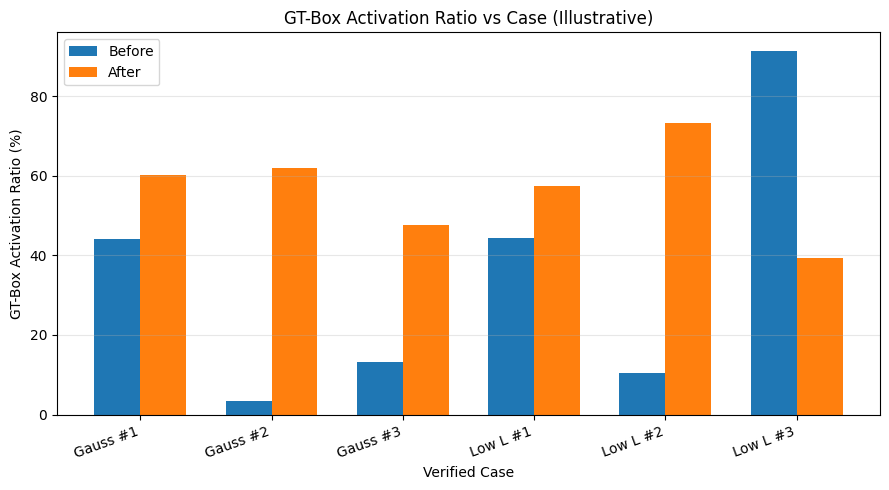

Saved: illustrative_cases_ratio_comparison.png / .pdf


In [14]:
if len(illustrative_df) > 0:
    x = np.arange(len(illustrative_df))
    width = 0.35
    plt.figure(figsize=(9, 5))
    plt.bar(x - width/2, illustrative_df["Before_Box_Ratio"].fillna(0) * 100, width, label="Before")
    plt.bar(x + width/2, illustrative_df["After_Box_Ratio"] * 100, width, label="After")
    labels = [f"{r.Condition[:5]} #{r.Case_Num}" for r in illustrative_df.itertuples()]
    plt.xticks(x, labels, rotation=20, ha="right")
    plt.xlabel("Verified Case")
    plt.ylabel("GT-Box Activation Ratio (%)")
    plt.title("GT-Box Activation Ratio vs Case (Illustrative)")
    plt.legend()
    plt.grid(axis="y", alpha=0.3)
    plt.tight_layout()
    for ext in ("png", "pdf"):
        plt.savefig(os.path.join(PLOTS_DIR, f"illustrative_cases_ratio_comparison.{ext}"), dpi=DPI, bbox_inches="tight")
    plt.show()
    plt.close()
    print("Saved: illustrative_cases_ratio_comparison.png / .pdf")
else:
    print("No verified illustrative cases found -- try lowering min_after_ratio in Cell 11b.")

## Cell 12 — Save results + ZIP

In [15]:
csv_path = os.path.join(RESULTS_DIR, "phase6_verification_cases.csv")
verification_df.to_csv(csv_path, index=False)
print("Saved:", csv_path)

config = {
    "before_model_path": BEFORE_MODEL_PATH,
    "after_model_path": AFTER_MODEL_PATH,
    "cam_layer_index": layer_idx,
    "verification_case_ids": VERIFICATION_CASE_IDS,
    "class_names": CLASS_NAMES,
}
config_path = os.path.join(CONFIG_DIR, "phase6_config.json")
with open(config_path, "w") as f:
    json.dump(config, f, indent=2)
print("Saved:", config_path)

zip_path = shutil.make_archive("/kaggle/working/phase6_xai_verification_results", "zip", OUTPUT_ROOT)
print("\nFINAL ZIP:")
print(" ", zip_path)

Saved: /kaggle/working/phase6_xai_verification/results/phase6_verification_cases.csv
Saved: /kaggle/working/phase6_xai_verification/config/phase6_config.json

FINAL ZIP:
  /kaggle/working/phase6_xai_verification_results.zip


## Cell 13 — Final summary

In [16]:
print("=" * 60)
print("PHASE 6 SUMMARY")
print("=" * 60)

print("\n--- Representative cases (Cell 10) ---")
print(verification_df.to_string(index=False))
for _, row in verification_df.iterrows():
    if pd.notna(row["Before_GT_Box_Activation_Ratio"]) and pd.notna(row["After_GT_Box_Activation_Ratio"]):
        delta = row["After_GT_Box_Activation_Ratio"] - row["Before_GT_Box_Activation_Ratio"]
        direction = "increased" if delta > 0 else ("decreased" if delta < 0 else "unchanged")
        print(f"{row['Case_ID']}: GT-box activation ratio {direction} by {abs(delta)*100:.1f} percentage points "
              f"({row['Before_GT_Box_Activation_Ratio']*100:.1f}% -> {row['After_GT_Box_Activation_Ratio']*100:.1f}%)")

print("\n--- PRIMARY quantitative result: unbiased n=30 aggregate (Cell 11d) ---")
for name, df in [("Gaussian Noise", noise_stats), ("Low Light", lowlight_stats)]:
    n_improved = (df["delta"] > 0).sum()
    n_total = len(df)
    print(f"{name}: {n_improved}/{n_total} cases improved ({n_improved/n_total*100:.1f}%), "
          f"mean delta {df['delta'].mean()*100:+.1f}pp, std {df['delta'].std()*100:.1f}")

print("\n--- Illustrative cases (Cell 11b/11c) -- QUALITATIVE ONLY, do not cite as headline stat ---")
if len(illustrative_df) > 0:
    print(illustrative_df.to_string(index=False))
else:
    print("No illustrative cases were found.")

print("\nOutput root:", OUTPUT_ROOT)
print("Final ZIP  :", zip_path)


PHASE 6 SUMMARY

--- Representative cases (Cell 10) ---
               Case_ID      Condition  Severity    GT_Label_Raw CAM_Target_Class  Before_Detected  Before_Confidence  Before_GT_Box_Activation_Ratio  After_Detected  After_Confidence  After_GT_Box_Activation_Ratio                                                                Figure_Path
       LowLight_FN_011      Low Light         4           Smoke            Smoke            False                NaN                        0.755360           False               NaN                       0.785973        /kaggle/working/phase6_xai_verification/figures/LowLight_FN_011.png
MotionBlur_Failure_015    Motion Blur         4            Fire             Fire            False                NaN                        0.006752           False               NaN                       0.014707 /kaggle/working/phase6_xai_verification/figures/MotionBlur_Failure_015.png
     Noise_Failure_018 Gaussian Noise         4 Background/None             F